In [ ]:
reference:-https://github.com/Amitava04/Micro-Credit-Defaulter-/blob/main/Micro_Credit.ipynb

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings 
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

Variable	Definition	Comment

label - Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}	

msisdn -	mobile number of user	

aon	- age on cellular network in days	

daily_decr30 -	Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)	

daily_decr90 -	Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)	

rental30 -	Average main account balance over last 30 days	Unsure of given definition

rental90 -	Average main account balance over last 90 days	Unsure of given definition

last_rech_date_ma -	Number of days till last recharge of main account	

last_rech_date_da -	Number of days till last recharge of data account	

last_rech_amt_ma -	Amount of last recharge of main account (in Indonesian Rupiah)	

cnt_ma_rech30 -	Number of times main account got recharged in last 30 days	

fr_ma_rech30 -	Frequency of main account recharged in last 30 days	Unsure of given definition

sumamnt_ma_rech30 -	Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)	

medianamnt_ma_rech30 -	Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)	

medianmarechprebal30 -	Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)	

cnt_ma_rech90 -	Number of times main account got recharged in last 90 days	

fr_ma_rech90 -	Frequency of main account recharged in last 90 days	Unsure of given definition

sumamnt_ma_rech90 -	Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)	

medianamnt_ma_rech90 -	Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)	

medianmarechprebal90 -	Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)	

cnt_da_rech30 -	Number of times data account got recharged in last 30 days	

fr_da_rech30 -	Frequency of data account recharged in last 30 days	

cnt_da_rech90 -	Number of times data account got recharged in last 90 days	

fr_da_rech90 -	Frequency of data account recharged in last 90 days	

cnt_loans30 -	Number of loans taken by user in last 30 days	

amnt_loans30 -	Total amount of loans taken by user in last 30 days	

maxamnt_loans30 -	maximum amount of loan taken by the user in last 30 days	There are only two options: 5 & 10 Rs., for which the user needs to pay back 6 & 12 Rs. respectively

medianamnt_loans30 -	Median of amounts of loan taken by the user in last 30 days	

cnt_loans90 -	Number of loans taken by user in last 90 days	

amnt_loans90 -	Total amount of loans taken by user in last 90 days	

maxamnt_loans90 -	maximum amount of loan taken by the user in last 90 days	

medianamnt_loans90 -	Median of amounts of loan taken by the user in last 90 days	

payback30 -	Average payback time in days over last 30 days	

payback90 -	Average payback time in days over last 90 days	

pcircle -	telecom circle	

pdate -	date	


In [2]:
data=pd.read_csv(r"C:\Users\Aditya\Downloads\Micro-Credit-Project--1-\Micro Credit Project\Data file.csv")
data.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


In [3]:
data.tail()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
209588,209589,1,22758I85348,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,1.0,1.000000,UPW,2016-06-17
209589,209590,1,95583I84455,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,0.0,0.0,0,0,3,18,6.0,0.0,3.0,18,6,0.0,1.0,1.000000,UPW,2016-06-12
209590,209591,1,28556I85350,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,0.0,0.0,0,0,4,42,12.0,0.0,6.0,54,12,0.0,4.0,3.833333,UPW,2016-07-29
209591,209592,1,59712I82733,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,0.0,0.0,1,0,2,18,12.0,0.0,3.0,24,12,0.0,0.0,10.500000,UPW,2016-07-25
209592,209593,1,65061I85339,1581.0,4489.362000,4534.820000,483.92,631.20,13.0,0.0,7526,2,1.0,9065.0,4532.5,356.70,3,19,16591,7526.0,392.20,0.0,0.0,0,0,2,18,12.0,0.0,2.0,18,12,0.0,0.0,0.000000,UPW,2016-07-07


In [4]:
#removing unwanted features 
#unnamed and mobile n 
data.drop(['Unnamed: 0','msisdn'],axis=1,inplace=True)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 35 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   aon                   209593 non-null  float64
 2   daily_decr30          209593 non-null  float64
 3   daily_decr90          209593 non-null  float64
 4   rental30              209593 non-null  float64
 5   rental90              209593 non-null  float64
 6   last_rech_date_ma     209593 non-null  float64
 7   last_rech_date_da     209593 non-null  float64
 8   last_rech_amt_ma      209593 non-null  int64  
 9   cnt_ma_rech30         209593 non-null  int64  
 10  fr_ma_rech30          209593 non-null  float64
 11  sumamnt_ma_rech30     209593 non-null  float64
 12  medianamnt_ma_rech30  209593 non-null  float64
 13  medianmarechprebal30  209593 non-null  float64
 14  cnt_ma_rech90         209593 non-null  int64  
 15  

In [6]:
#since date is in the form of object type we have convert it into date time for extracting usefull information from this

data['pdate']=pd.to_datetime(data['pdate'])

#pcircle has only one unique value so it does not contribute more for our prediction so we can drop this one 

data.drop('pcircle',axis=1,inplace=True)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 34 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   label                 209593 non-null  int64         
 1   aon                   209593 non-null  float64       
 2   daily_decr30          209593 non-null  float64       
 3   daily_decr90          209593 non-null  float64       
 4   rental30              209593 non-null  float64       
 5   rental90              209593 non-null  float64       
 6   last_rech_date_ma     209593 non-null  float64       
 7   last_rech_date_da     209593 non-null  float64       
 8   last_rech_amt_ma      209593 non-null  int64         
 9   cnt_ma_rech30         209593 non-null  int64         
 10  fr_ma_rech30          209593 non-null  float64       
 11  sumamnt_ma_rech30     209593 non-null  float64       
 12  medianamnt_ma_rech30  209593 non-null  float64       
 13 

In [8]:
data['month']=data['pdate'].dt.month

data['day']=data['pdate'].dt.day

#iam not seperating year because year is only one year that is 2016 so it is not useful for our prediction 

In [9]:
#pdate is not usefull after extracting day and month from this feature so we can remove this as well
data.drop('pdate',axis=1,inplace=True)

In [10]:
data.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,month,day
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000
mean,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,3712.202921,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,262.578110,3749.494447,0.041495,0.045712,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485,6.797321,14.39894
std,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,53374.833430,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,4183.897978,53885.414979,0.397556,0.951386,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108,0.741435,8.43890
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.00000
25%,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,0.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000,6.000000,7.00000
50%,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,0.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,0.000000,0.000000,0.000000,0.000000,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667,7.000000,14.00000
75%,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,0.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,0.000000,0.000000,0.000000,0.000000,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000,7.000000,21.00000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,999171.809410,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.00000,88.000000,953036.000000,55000.000000,41456.500000,99914.441420,999809.240107,38.000000,64.000000,50.000000,306.000000,99864.560864,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000,8.000000,31.00000


#observation

##### ==> no null values are present

##### ==> there is too much difference in 75% and max, it indicates there are outliers are present 

##### ==> in most of the features standard deviation is more than mean it indicates that the data in that feature is not normally distributed

##### ==> and some features min value is  in negative form so it does not make any sence, those particular features we will treat later

##### ==> some features are having zeros in min, 50% , and 75% quartiles so it indicates that there are most of the data is belongs to zeros only we'll check it again

In [11]:
#the below features are having more than 90% of the data is zeros

#last_rech_date_da,
#cnt_da_rech30,
#fr_da_rech30,
#cnt_da_rech90,
#fr_da_rech90,
#medianamnt_loans30,
#medianamnt_loans90

#droping features which are having more than 90% of the data is zeros
data.drop(['last_rech_date_da','cnt_da_rech30','fr_da_rech30','cnt_da_rech90','fr_da_rech90','medianamnt_loans30','medianamnt_loans90'],axis=1 ,inplace=True)

data.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000
mean,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,2.758981,17.952021,274.658747,18.520919,23.645398,6.703134,3.398826,4.321485,6.797321,14.39894
std,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,2.554502,17.379741,4245.264648,224.797423,26.469861,2.103864,8.813729,10.308108,0.741435,8.43890
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.00000
25%,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,1.000000,6.000000,6.000000,1.000000,6.000000,6.000000,0.000000,0.000000,6.000000,7.00000
50%,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,2.000000,12.000000,6.000000,2.000000,12.000000,6.000000,0.000000,1.666667,7.000000,14.00000
75%,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,4.000000,24.000000,6.000000,5.000000,30.000000,6.000000,3.750000,4.500000,7.000000,21.00000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.00000,88.000000,953036.000000,55000.000000,41456.500000,50.000000,306.000000,99864.560864,4997.517944,438.000000,12.000000,171.500000,171.500000,8.000000,31.00000


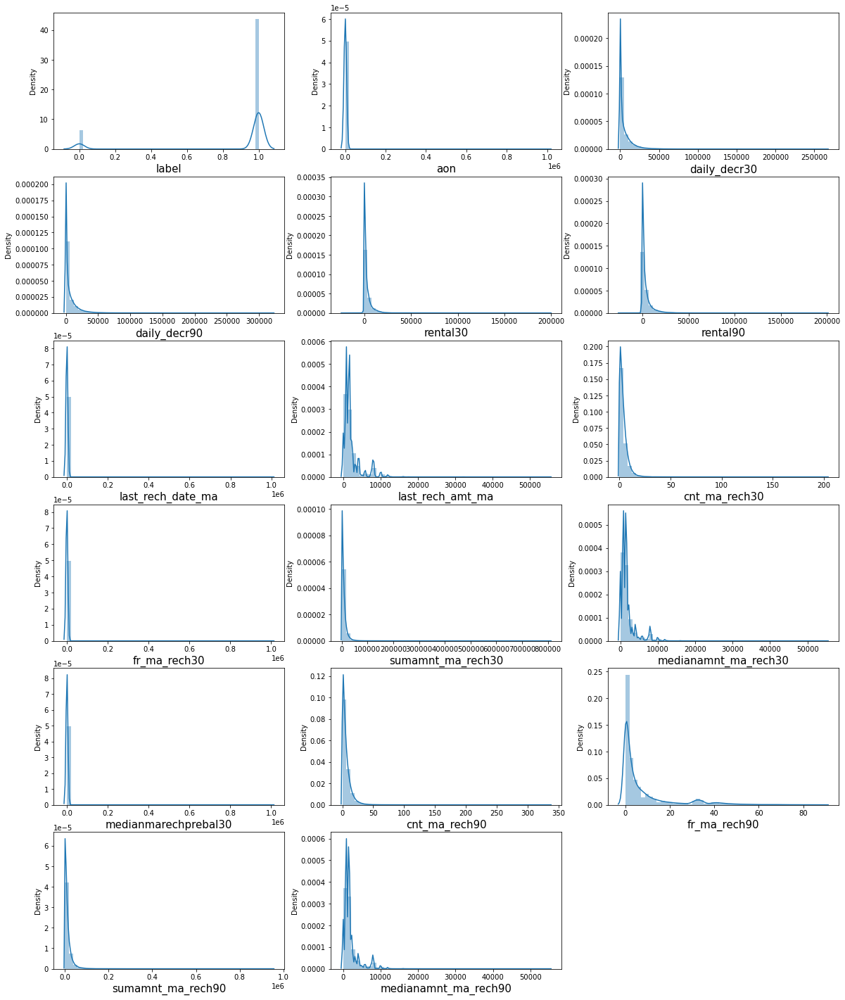

In [60]:
plt.figure(figsize=(20,25))
plotnumber =1

for column in data:
    if plotnumber <= 17:
        ax=plt.subplot(6,3,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=15)
        
    plotnumber+=1
plt.show()

In [12]:
data2=data.iloc[:,[17,18,19,20,21,22,23,24,25,26,27]]
data2.head()

,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
0,7.50,2,12,6.0,2.0,12,6,29.000000,29.000000,7,20
1,61.04,1,12,12.0,1.0,12,12,0.000000,0.000000,8,10
2,66.32,1,6,6.0,1.0,6,6,0.000000,0.000000,8,19
3,2.50,2,12,6.0,2.0,12,6,0.000000,0.000000,6,6
4,35.00,7,42,6.0,7.0,42,6,2.333333,2.333333,6,22


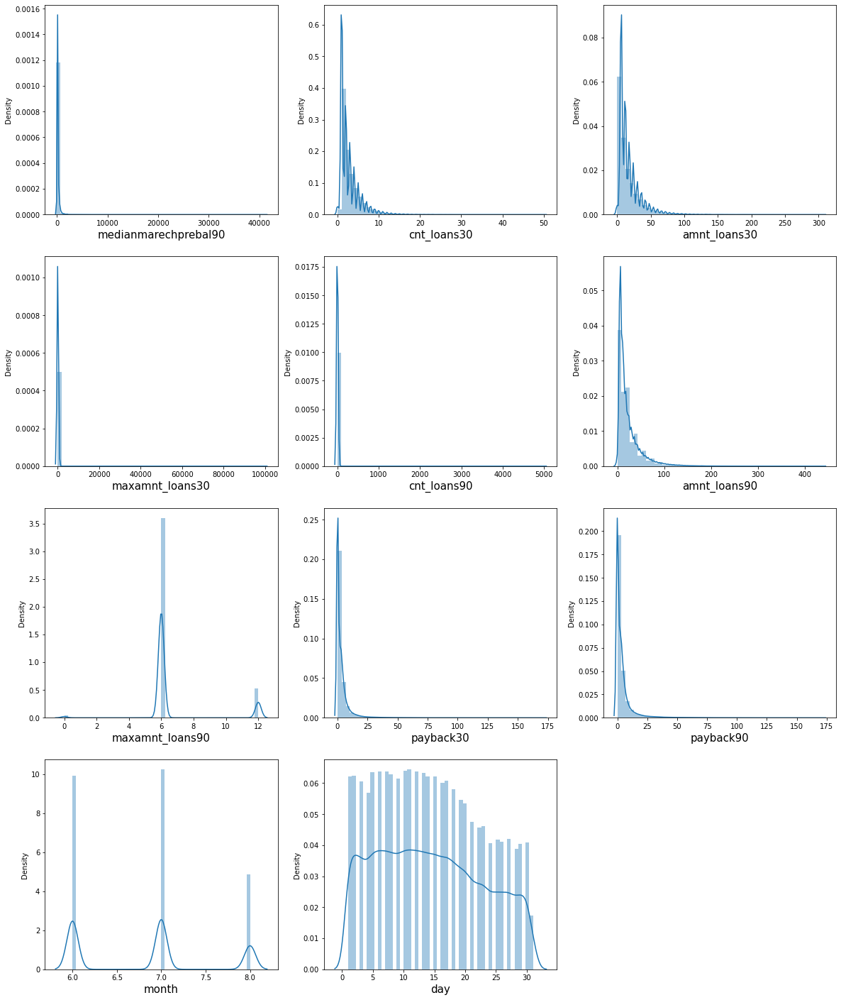

In [64]:
plt.figure(figsize=(20,25))
plotnumber =1

for column in data2:
    if plotnumber < 12:
        ax=plt.subplot(4,3,plotnumber)
        sns.distplot(data2[column])
        plt.xlabel(column,fontsize=15)
        
    plotnumber+=1
plt.show()

In [ ]:
#observation

# almost all the features are skewed right side we have to remove the skeweness of continuous features later

<AxesSubplot:xlabel='label', ylabel='count'>

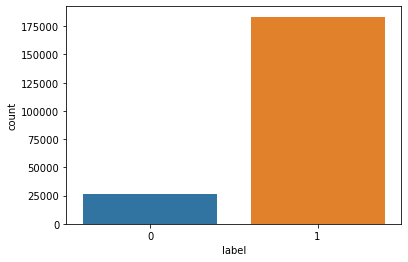

In [12]:
sns.countplot(data['label'])

In [ ]:
#target variable is imbalanced

<AxesSubplot:xlabel='label', ylabel='month'>

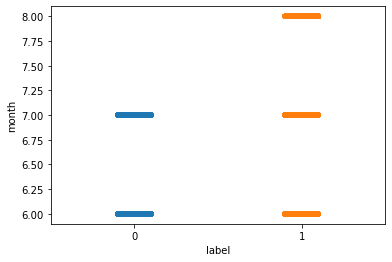

In [16]:
sns.stripplot(y='month',x='label',data=data)

In [ ]:
#there are mainly three months are there 6, 7 and 8  

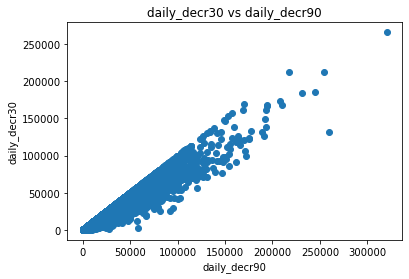

In [22]:
plt.scatter(y='daily_decr30',x='daily_decr90',data=data)
plt.xlabel('daily_decr90')
plt.ylabel('daily_decr30')
plt.title('daily_decr30 vs daily_decr90')
plt.show()

#observation

#we can see that Daily amount spent from main account, averaged over last 30 days and Daily amount spent from main account, averaged over last 90 days are highly correlated with each other we agin check it by using heat map by using pearson correlation 

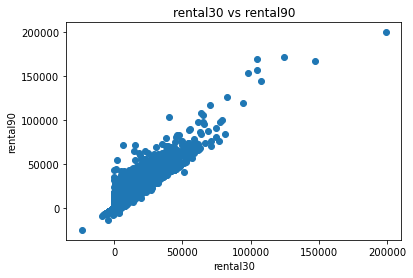

In [23]:
plt.scatter(x='rental30',y='rental90',data=data)
plt.xlabel('rental30')
plt.ylabel('rental90')
plt.title('rental30 vs rental90')
plt.show()

In [ ]:
#observation 

# rental30 and rental90 are correlating each other but we can check it by using heatmap 

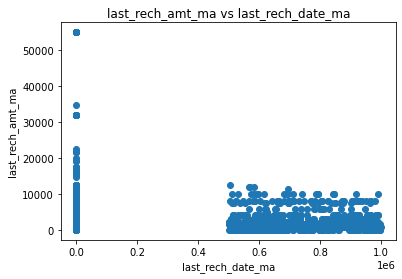

In [25]:
plt.scatter(y='last_rech_amt_ma',x='last_rech_date_ma',data=data)
plt.ylabel('last_rech_amt_ma')
plt.xlabel('last_rech_date_ma')
plt.title('last_rech_amt_ma vs last_rech_date_ma')
plt.show()

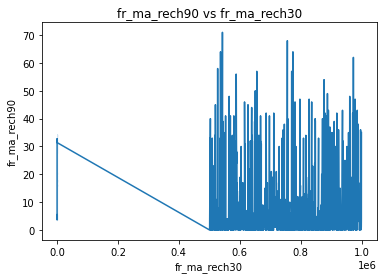

In [32]:
sns.lineplot(y='fr_ma_rech90',x='fr_ma_rech30',data=data)
plt.ylabel('fr_ma_rech90')
plt.xlabel('fr_ma_rech30')
plt.title('fr_ma_rech90 vs fr_ma_rech30')
plt.show()

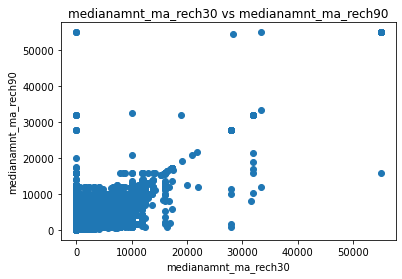

In [34]:
plt.scatter(x='medianamnt_ma_rech30',y='medianamnt_ma_rech90',data=data)
plt.xlabel('medianamnt_ma_rech30')
plt.ylabel('medianamnt_ma_rech90')
plt.title('medianamnt_ma_rech30 vs medianamnt_ma_rech90')
plt.show()

In [ ]:
#observation 

# it looks there is some relation exitst between them but not too much

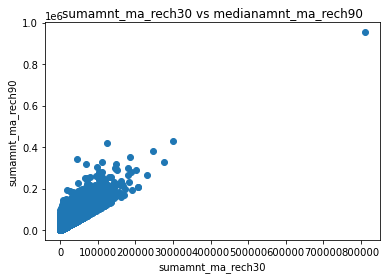

In [35]:
plt.scatter(x='sumamnt_ma_rech30',y='sumamnt_ma_rech90',data=data)
plt.xlabel('sumamnt_ma_rech30')
plt.ylabel('sumamnt_ma_rech90')
plt.title('sumamnt_ma_rech30 vs medianamnt_ma_rech90')
plt.show()

In [ ]:
#observation 

#there is good relation ship exists between sumamnt_ma_rech30 and sumamnt_ma_rech90

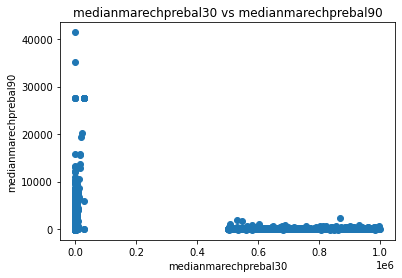

In [14]:
plt.scatter(x='medianmarechprebal30',y='medianmarechprebal90',data=data)
plt.xlabel('medianmarechprebal30')
plt.ylabel('medianmarechprebal90')
plt.title('medianmarechprebal30 vs medianmarechprebal90')
plt.show()

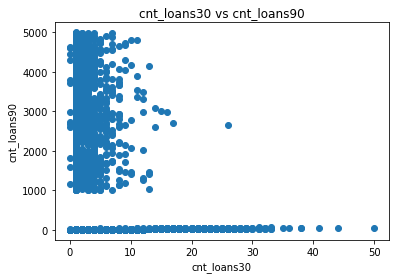

In [15]:
plt.scatter(x='cnt_loans30',y='cnt_loans90',data=data)
plt.xlabel('cnt_loans30')
plt.ylabel('cnt_loans90')
plt.title('cnt_loans30 vs cnt_loans90')
plt.show()

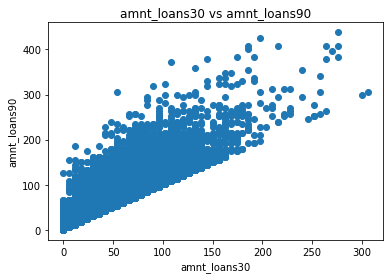

In [16]:
plt.scatter(x='amnt_loans30',y='amnt_loans90',data=data)
plt.xlabel('amnt_loans30')
plt.ylabel('amnt_loans90')
plt.title('amnt_loans30 vs amnt_loans90')
plt.show()

In [ ]:
#observation 

#there is good relationship exists between amnt_loans30 and amnt_loans90

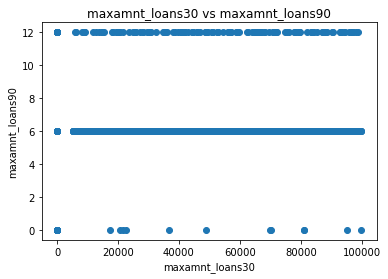

In [17]:
plt.scatter(x='maxamnt_loans30',y='maxamnt_loans90',data=data)
plt.xlabel('maxamnt_loans30')
plt.ylabel('maxamnt_loans90')
plt.title('maxamnt_loans30 vs maxamnt_loans90')
plt.show()

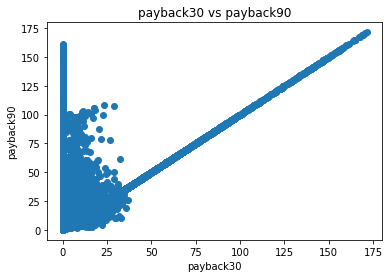

In [18]:
plt.scatter(x='payback30',y='payback90',data=data)
plt.xlabel('payback30')
plt.ylabel('payback90')
plt.title('payback30 vs payback90')
plt.show()

from the above plots i observe that there are some features are highly correlated with each other so now i can check by using correlation heatmap to remove highly correlated features 

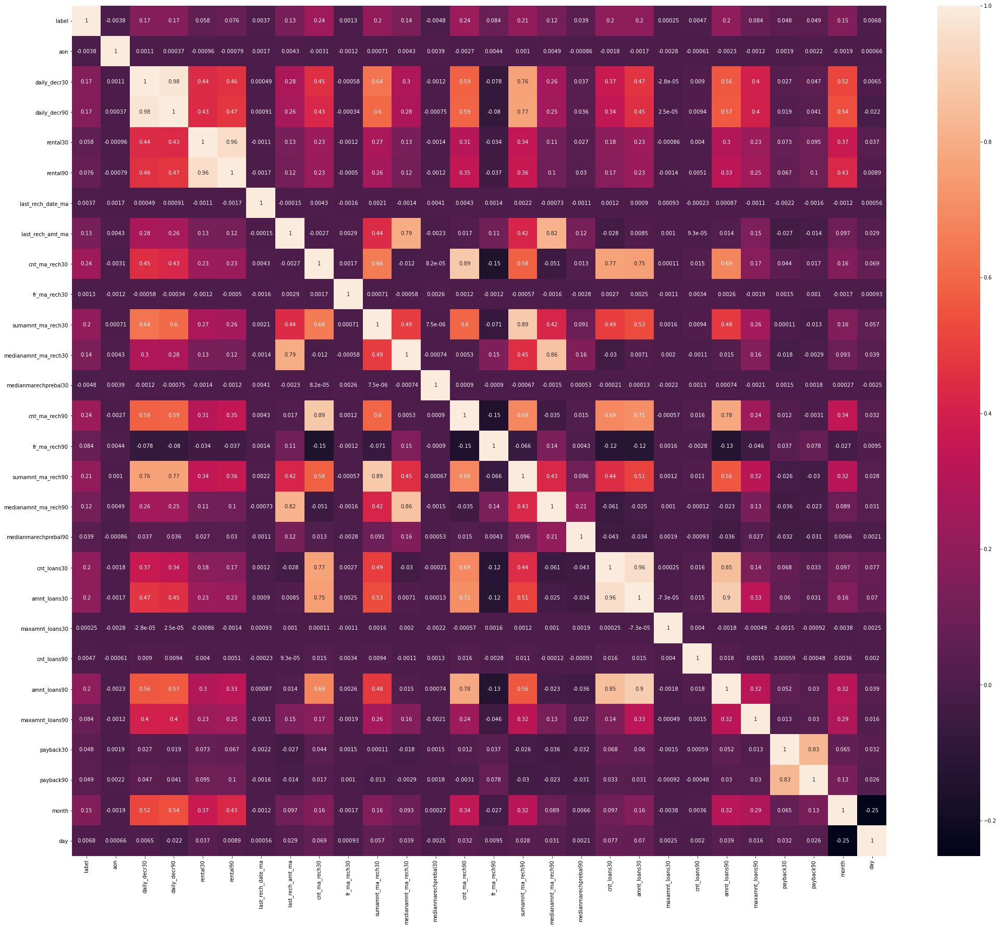

In [27]:
plt.figure(figsize=(35,30))
sns.heatmap(data.corr(),annot=True)
plt.show()

In [20]:
data.head()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.000000,29.000000,7,20
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.000000,0.000000,8,10
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6,6.0,1.0,6,6,0.000000,0.000000,8,19
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,2,12,6.0,2.0,12,6,0.000000,0.000000,6,6
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,42,6.0,7.0,42,6,2.333333,2.333333,6,22


In [13]:
#droping highly correlated features and those correlated features which are less correlation with label  

data.drop(['daily_decr30','rental30','amnt_loans30'],axis=1,inplace=True)

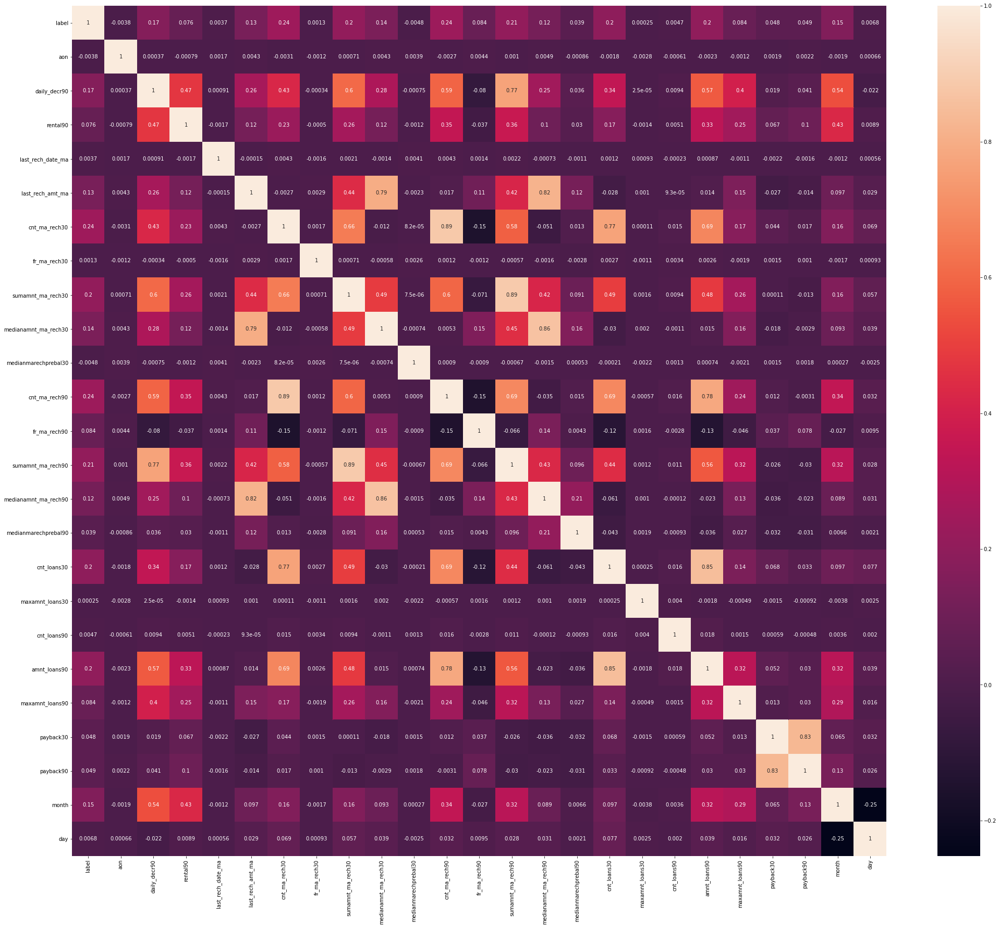

In [14]:
plt.figure(figsize=(35,30))
sns.heatmap(data.corr(),annot=True)
plt.show()

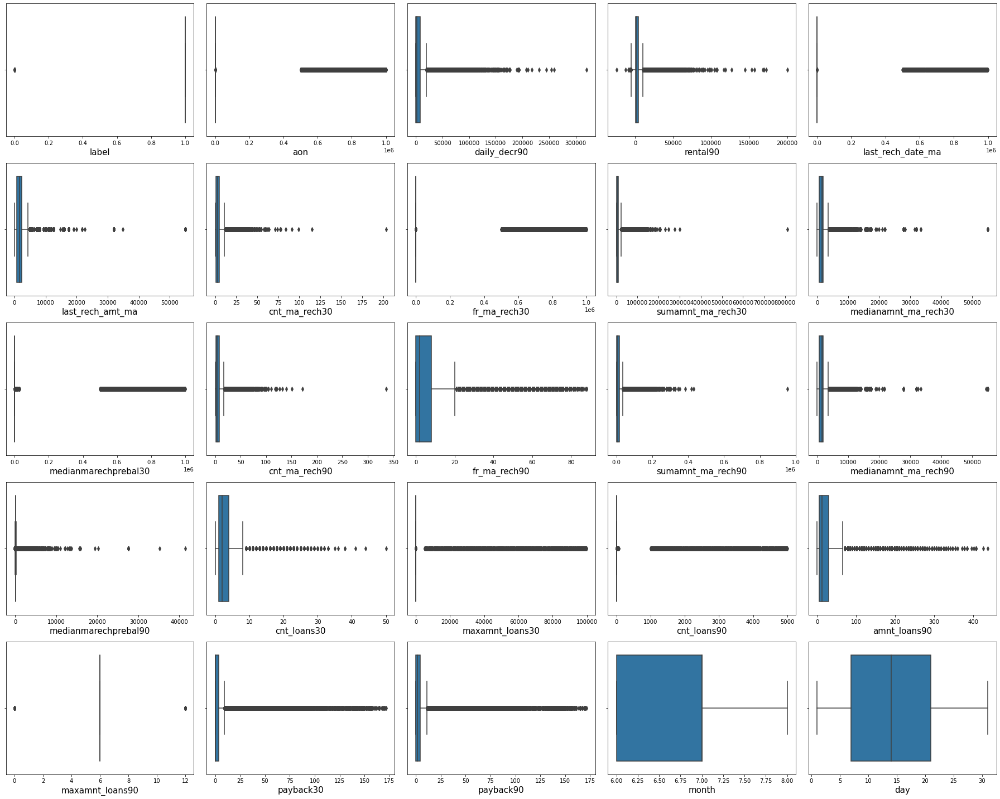

In [95]:
plt.figure(figsize=(25,20))
plotnumber=1

for column in data:
    if plotnumber<=25:
        ax=plt.subplot(5,5,plotnumber)
        sns.boxplot(data[column],orient="h")
        plt.xlabel(column,fontsize=15)
        
    plotnumber+=1
    
plt.tight_layout()

In [14]:
data1=data.copy()

In [15]:
data1.shape

(209593, 25)

In [16]:
data1.head()

,label,aon,daily_decr90,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
0,0,272.0,3065.150000,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,6.0,2.0,12,6,29.000000,29.000000,7,20
1,1,712.0,12124.750000,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12.0,1.0,12,12,0.000000,0.000000,8,10
2,1,535.0,1398.000000,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6.0,1.0,6,6,0.000000,0.000000,8,19
3,1,241.0,21.228000,159.42,41.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,2,6.0,2.0,12,6,0.000000,0.000000,6,6
4,1,947.0,150.619333,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,6.0,7.0,42,6,2.333333,2.333333,6,22


In [17]:
#treating outliers

from scipy.stats import zscore
z_score=zscore(data1.drop(['month','day','label'],axis=1)) #since these features are not having outliers so iam not apply zscore to thse features 
abs_z_score=np.abs(z_score)

filtering_entry=(abs_z_score<4.5).all(axis=1)
data1=data1[filtering_entry]

In [18]:
data1.shape

(191994, 25)

In [19]:
data_loss=((209593-191994)/209593)*100
data_loss

8.396749891456299

In [20]:
data1['aon'].min() #since feature of using of cellular network days should be +ve so negative data not make sence in ths particular feature

-48.0

In [22]:
data1.head()

,label,aon,daily_decr90,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
0,0,272.0,3065.150000,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,6.0,2.0,12,6,29.000000,29.000000,7,20
1,1,712.0,12124.750000,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12.0,1.0,12,12,0.000000,0.000000,8,10
2,1,535.0,1398.000000,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6.0,1.0,6,6,0.000000,0.000000,8,19
3,1,241.0,21.228000,159.42,41.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,2,6.0,2.0,12,6,0.000000,0.000000,6,6
4,1,947.0,150.619333,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,6.0,7.0,42,6,2.333333,2.333333,6,22


In [21]:
#lets check how much data is belongs to negative values 
ngtv=[]
for column in data1:
    for i in data1[column]:
        if i<0:
            ngtv.append(i)
            
            
len(ngtv)

12816

In [22]:
data1.shape

(191994, 25)

In [23]:
#negative data is not makes sence in any of the feature so iam replacing -ve data by nan then i remove the nan values

data1[data1<0]=np.nan

data1.isnull().sum()

label                      0
aon                     1467
daily_decr90            1749
rental90                5374
last_rech_date_ma       1144
last_rech_amt_ma           0
cnt_ma_rech30              0
fr_ma_rech30               0
sumamnt_ma_rech30          0
medianamnt_ma_rech30       0
medianmarechprebal30    1506
cnt_ma_rech90              0
fr_ma_rech90               0
sumamnt_ma_rech90          0
medianamnt_ma_rech90       0
medianmarechprebal90    1576
cnt_loans30                0
maxamnt_loans30            0
cnt_loans90                0
amnt_loans90               0
maxamnt_loans90            0
payback30                  0
payback90                  0
month                      0
day                        0
dtype: int64

In [24]:
data1=data1.dropna()

In [25]:
data1.shape

(180774, 25)

In [28]:
index_0=np.where(data1['daily_decr90']==0)
pd.DataFrame(index_0)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [ ]:
#observation
# it is possible Daily amount spent from main account, averaged over last 30 days to be zero so we need not to fill zero with something 

In [183]:
index_0=np.where(data1['rental90']==0)
pd.DataFrame(index_0)

0     1     2     3     4     5     6     7     8     9     10    11    \
0    68    95   114   150   188   290   296   302   364   392   406   426   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0   540   585   609   613   618   640   690   719   770   773   789   798   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0   810   813   838   875   908   920  1086  1101  1200  1265  1293  1395   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0  1402  1457  1466  1489  1517  1571  1757  1840  1867  1869  1883  1891   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0  1950  1962  2145  2147  2219  2224  2244  2270  2336  2372  2374  2381   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0  2383  2385  2428  2474  2519  2577  2578  2628  2718  2723  2736  2740   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0  2749  2769  2782  2870  2925  2928  2951  2962  2973  2996  3006  3026   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0  3048  3085  3134  3164  3165  3309  3355  3357  3371  3389  3425  3455   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0  3463  3518  3552  3564  3789  3794  3840  3842  3847  3881  3970  4011   

   108   109   110   111   112   113   114   115   116   117   118   119   \
0  4022  4028  4042  4060  4088  4107  4187  4268  4275  4335  4344  4354   

   120   121   122   123   124   125   126   127   128   129   130   131   \
0  4440  4475  4501  4577  4686  4696  4722  4753  4766  4770  4849  4851   

   132   133   134   135   136   137   138   139   140   141   142   143   \
0  4854  4858  4916  4921  4942  4990  5046  5049  5090  5098  5114  5137   

   144   145   146   147   148   149   150   151   152   153   154   155   \
0  5145  5173  5231  5277  5305  5375  5379  5383  5401  5418  5445  5599   

   156   157   158   159   160   161   162   163   164   165   166   167   \
0  5620  5632  5840  5855  5856  5880  5917  5960  6006  6093  6178  6289   

   168   169   170   171   172   173   174   175   176   177   178   179   \
0  6307  6317  6331  6444  6457  6462  6570  6582  6595  6615  6689  6708   

   180   181   182   183   184   185   186   187   188   189   190   191   \
0  6799  6891  6987  7017  7021  7026  7040  7124  7195  7244  7339  7350   

   192   193   194   195   196   197   198   199   200   201   202   203   \
0  7352  7358  7367  7370  7395  7443  7454  7463  7484  7494  7519  7522   

   204   205   206   207   208   209   210   211   212   213   214   215   \
0  7525  7544  7554  7634  7638  7656  7668  7714  7749  7777  7818  7821   

   216   217   218   219   220   221   222   223   224   225   226   227   \
0  7893  7919  7950  7986  7993  8014  8017  8019  8161  8164  8180  8255   

   228   229   230   231   232   233   234   235   236   237   238   239   \
0  8270  8320  8375  8410  8413  8420  8422  8431  8449  8457  8499  8553   

   240   241   242   243   244   245   246   247   248   249   250   251   \
0  8712  8776  8806  8817  8871  8879  8885  8906  8924  8947  9033  9096   

   252   253   254   255   256   257   258   259   260   261   262   263   \
0  9167  9183  9190  9284  9297  9389  9396  9442  9458  9466  9471  9545   

   264   265   266   267   268   269   270   271   272   273   274   275   \
0  9599  9678  9721  9748  9760  9778  9783  9844  9854  9914  9948  9974   

    276    277    278    279    280    281    282    283    284    285   \
0  10030  10045  10046  10091  10094  10137  10156  10236  10253  10308   

    286    287    288    289    290    291    292    293    294    295   \
0  10320  10408  10420  10440  10504  10654  10680  10733  10746  10747   

    296    297    298    299    300    301    302    303    304    305   \
0  10776  10850  10862  10894  10918  10956  10968  11022  11

In [ ]:
#observation

#it is possible Average main account balance over last 90 days to be zero so we need not worry about zero value

In [58]:
index_0=np.where(data1['last_rech_date_ma']==0)
pd.DataFrame(index_0)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [ ]:
#coclusion 

# as the above features remaining features also possible to have zero values  

In [26]:
#checking skewness

data1.skew()

label                   -2.327911
aon                      0.965840
daily_decr90             2.290455
rental90                 2.482054
last_rech_date_ma        3.594230
last_rech_amt_ma         2.249804
cnt_ma_rech30            1.538116
fr_ma_rech30             1.803123
sumamnt_ma_rech30        1.963485
medianamnt_ma_rech30     2.421083
medianmarechprebal30    10.661638
cnt_ma_rech90            1.655893
fr_ma_rech90             2.139938
sumamnt_ma_rech90        2.060268
medianamnt_ma_rech90     2.455984
medianmarechprebal90     4.744945
cnt_loans30              1.766989
maxamnt_loans30         42.733311
cnt_loans90             97.130737
amnt_loans90             1.985385
maxamnt_loans90          1.708595
payback30                3.415292
payback90                3.175966
month                    0.321123
day                      0.188997
dtype: float64

In [ ]:
#observation 

# except month day all are having skewed data so as we seen in the previuos plots the data is highly skewed right side so we can use 

In [27]:
data1.shape

(180774, 25)

In [28]:
data2=data1.copy()

In [29]:
data2.shape

(180774, 25)

In [30]:
from sklearn.preprocessing import PowerTransformer
ptr=PowerTransformer(method='yeo-johnson')

In [31]:
data1.columns

Index(['label', 'aon', 'daily_decr90', 'rental90', 'last_rech_date_ma',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30',
       'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90',
       'payback30', 'payback90', 'month', 'day'],
      dtype='object')

In [32]:
non_skew=pd.DataFrame(data1[['label','month','day']])

In [33]:
non_skew.head()

,label,month,day
0,0,7,20
1,1,8,10
2,1,8,19
3,1,6,6
4,1,6,22


In [34]:
data2=data1.drop(['label','month','day'],axis=1)

In [35]:
data2=pd.DataFrame(ptr.fit_transform(data2),columns=data2.columns)
data2.skew()

aon                    -0.051891
daily_decr90           -0.140785
rental90               -0.056487
last_rech_date_ma       0.035301
last_rech_amt_ma       -0.090726
cnt_ma_rech30          -0.013892
fr_ma_rech30            0.118806
sumamnt_ma_rech30      -0.380393
medianamnt_ma_rech30   -0.225570
medianmarechprebal30   -0.028858
cnt_ma_rech90          -0.018371
fr_ma_rech90            0.130406
sumamnt_ma_rech90      -0.277954
medianamnt_ma_rech90   -0.078718
medianmarechprebal90   -0.007056
cnt_loans30             0.036687
maxamnt_loans30        -0.671764
cnt_loans90             0.086196
amnt_loans90           -0.001302
maxamnt_loans90         0.376743
payback30               0.273543
payback90               0.182230
dtype: float64

In [36]:
data1.shape

(180774, 25)

In [37]:
data2.tail()

,aon,daily_decr90,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90
180769,-0.266033,-0.608213,-0.130846,-0.847944,1.160948,0.077289,0.136049,0.743286,0.999659,0.671723,-0.289972,-0.080339,0.348185,1.005598,0.673455,-0.005250,-0.118548,-0.213725,-0.275506,-0.278939,0.074869,-0.123497
180770,0.962187,-1.005219,0.139199,0.231350,-0.431708,0.380946,-0.294510,-0.181216,-0.308863,1.059795,0.366501,-0.080339,-0.305729,-0.404451,0.822866,0.552684,-0.118548,0.288337,0.179717,-0.278939,0.074869,-0.123497
180771,0.880095,1.084497,1.319421,-0.013070,0.113317,0.633305,1.109881,0.644607,0.240332,0.297791,1.032467,0.494841,0.859037,0.184590,0.200708,0.936947,1.525140,1.084099,1.421987,2.362880,0.967914,0.745358
180772,1.660370,1.111110,-0.186725,-0.345193,-0.431708,0.633305,0.621324,0.890989,-0.308863,1.071654,0.366501,0.352891,0.824866,0.664549,0.737707,-0.005250,1.525140,0.288337,0.505053,2.362880,-0.943936,1.369448
180773,1.521297,0.639812,-0.420056,1.224608,2.063122,-0.305900,-0.294510,0.618620,1.456134,1.655275,-0.289972,1.288534,0.751220,2.344008,1.887351,-0.005250,1.525140,-0.213725,0.179717,2.362880,-0.943936,-1.026797


In [38]:
data2.shape

(180774, 22)

In [39]:
non_skew.shape

(180774, 3)

In [40]:
# to concate two data frames we have to reset index otherwise it considered there are same data present in both the sets

non_skew.reset_index(inplace = True, drop = True)
non_skew.tail()

,label,month,day
180769,1,6,17
180770,1,6,12
180771,1,7,29
180772,1,7,25
180773,1,7,7


In [41]:
data1.shape

(180774, 25)

In [42]:
data_final2=pd.concat([data2,non_skew],axis=1)
print('original data1 shape',data1.shape)
print('skewed data set shape',data2.shape)
print('after concatinate shape',data_final2.shape)

original data1 shape (180774, 25)
skewed data set shape (180774, 22)
after concatinate shape (180774, 25)


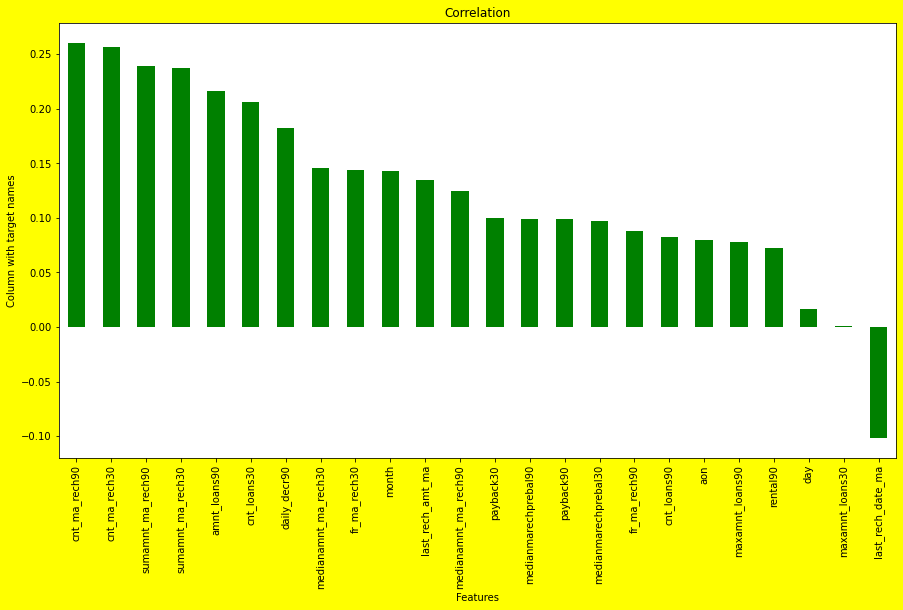

In [212]:
#checking correlation with target label

plt.figure(figsize =(15, 8),facecolor='yellow')
data1.corr()['label'].sort_values(ascending = False).drop(['label']).plot(kind ='bar', color ='green')
plt.xlabel('Features')
plt.ylabel('Column with target names')
plt.title('Correlation')
plt.show()

In [43]:
X=data_final2.drop('label',axis=1)
y=data_final2['label']

In [44]:
print(y.value_counts())

1    158946
0     21828
Name: label, dtype: int64


In [45]:
#balance the target variable by using SMOTE
from imblearn.over_sampling import SMOTE
sm=SMOTE()
X,y=sm.fit_resample(X,y)

In [46]:
print(y.value_counts())

0    158946
1    158946
Name: label, dtype: int64


In [47]:
#scaling the data by using minmax scaler
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
x=scaler.fit_transform(X)
x

array([[0.52231298, 0.61584439, 0.30486368, ..., 0.93078007, 0.5       ,
        0.63333333],
       [0.70465668, 0.78402937, 0.61573129, ..., 0.        , 1.        ,
        0.3       ],
       [0.64652234, 0.53023364, 0.43049548, ..., 0.        , 1.        ,
        0.6       ],
       ...,
       [0.70927678, 0.11247824, 0.57001483, ..., 0.        , 0.        ,
        0.36666667],
       [0.55681005, 0.0199194 , 0.13358129, ..., 0.        , 0.        ,
        0.06666667],
       [0.66892603, 0.59837216, 0.58539111, ..., 0.        , 0.5       ,
        0.26666667]])

In [48]:
from sklearn.decomposition import PCA
pca=PCA()
pca.fit_transform(x)

array([[ 8.79005918e-01, -6.08861308e-01, -2.20537252e-01, ...,
         1.23459513e-03,  2.60258224e-03, -4.63105235e-03],
       [ 2.30713481e-01,  8.95387273e-01,  7.26839379e-01, ...,
        -1.18529163e-02, -9.68713306e-03, -3.46056755e-02],
       [-2.00112009e-01,  4.42837474e-01,  5.90482367e-01, ...,
         2.10439514e-03, -1.65051418e-04,  4.54907011e-03],
       ...,
       [-2.15337323e-01,  3.72986446e-01, -4.11822423e-01, ...,
         8.33089791e-04, -9.21100548e-03, -6.78363049e-04],
       [-1.25910925e+00, -3.98900042e-01, -1.02929807e-02, ...,
        -2.12997794e-04,  3.51834413e-04, -1.16719398e-03],
       [-1.37468746e-01,  2.51411609e-01,  3.16403320e-01, ...,
         4.19885026e-03,  4.06909080e-03,  1.65954295e-03]])

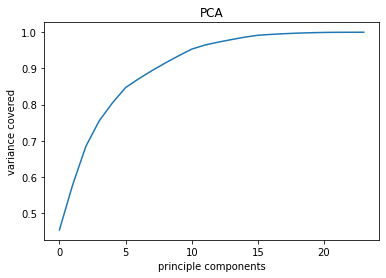

In [49]:
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('principle components')
plt.ylabel('variance covered')
plt.title('PCA')
plt.show()

In [ ]:
#from the above plot 18 pca cover 98% data so i can choose 18 pca's

In [50]:
pca=PCA(n_components=18)
pcomponent=pca.fit_transform(x)
x_pca=pd.DataFrame(pcomponent,columns =['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11',
                                        'PC12','PC13','PC14','PC15','PC16','PC17','PC18'])

In [51]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
lr=LogisticRegression()

In [52]:
#finding best random state 
maxAccu=0
maxRS=0
for i in range(1,800):
    x_train,x_test,y_train,y_test=train_test_split(x_pca,y,test_size=0.25,random_state=i)
    lr.fit(x_train,y_train)
    predx=lr.predict(x_test)
    acc=accuracy_score(y_test,predx)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('best accuracy is',maxAccu,'on random_state',maxRS)   

best accuracy is 0.7770815245429266 on random_state 276


In [52]:
x_train,x_test,y_train,y_test=train_test_split(x_pca,y,test_size=0.25,random_state=276)

In [53]:
def print_score(clf,x_train,x_test,y_train,y_test,train=True):
    if train:
        y_pred=clf.predict(x_train)
        print("\n==========train results============")
        print(f'accuracy score:{accuracy_score(y_train,y_pred)*100:2f}%')
        
    elif train==False:
        pred=clf.predict(x_test)
        print('\n=========test reslts===========')
        print(f'accuracy score is:{accuracy_score(y_test,pred)*100:2f}%')
        print('\n')
        print(confusion_matrix(y_test,pred))
        print('\n')
        print(classification_report(y_test,pred))
        scr=cross_val_score(clf,x_pca,y,cv=10)
        print('cross validation score',scr.mean())
        

In [62]:
# Logistic regression
lr=LogisticRegression()
lr.fit(x_train,y_train)

print_score(lr,x_train,x_test,y_train,y_test,train=True)
print_score(lr,x_train,x_test,y_train,y_test,train=False)


==========train results============
accuracy score:77.213645%

=========test reslts===========
accuracy score is:77.626364%


[[31396  8348]
 [ 9433 30296]]


              precision    recall  f1-score   support

           0       0.77      0.79      0.78     39744
           1       0.78      0.76      0.77     39729

    accuracy                           0.78     79473
   macro avg       0.78      0.78      0.78     79473
weighted avg       0.78      0.78      0.78     79473

cross validation score 0.7731179390814696


In [61]:
#KNN
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
print_score(knn,x_train,x_test,y_train,y_test,train=True)
print_score(knn,x_train,x_test,y_train,y_test,train=False)


==========train results============
accuracy score:92.771969%

=========test reslts===========
accuracy score is:90.070842%


[[39200   544]
 [ 7347 32382]]


              precision    recall  f1-score   support

           0       0.84      0.99      0.91     39744
           1       0.98      0.82      0.89     39729

    accuracy                           0.90     79473
   macro avg       0.91      0.90      0.90     79473
weighted avg       0.91      0.90      0.90     79473

cross validation score 0.9061410942478721


In [65]:
#Decision Tree classifier
from sklearn.tree import DecisionTreeClassifier
dcfr=DecisionTreeClassifier()
dcfr.fit(x_train,y_train)
print_score(dcfr,x_train,x_test,y_train,y_test,train=True)
print_score(dcfr,x_train,x_test,y_train,y_test,train=False)


==========train results============
accuracy score:99.999161%

=========test reslts===========
accuracy score is:87.185585%


[[35298  4446]
 [ 5738 33991]]


              precision    recall  f1-score   support

           0       0.86      0.89      0.87     39744
           1       0.88      0.86      0.87     39729

    accuracy                           0.87     79473
   macro avg       0.87      0.87      0.87     79473
weighted avg       0.87      0.87      0.87     79473

cross validation score 0.879880603694752


In [60]:
#random forest classifier 
from sklearn.ensemble import RandomForestClassifier
rfclf=RandomForestClassifier()
rfclf.fit(x_train,y_train)
print_score(rfclf,x_train,x_test,y_train,y_test,train=True)
print_score(rfclf,x_train,x_test,y_train,y_test,train=False)


==========train results============
accuracy score:99.997483%

=========test reslts===========
accuracy score is:93.283253%


[[37681  2063]
 [ 3275 36454]]


              precision    recall  f1-score   support

           0       0.92      0.95      0.93     39744
           1       0.95      0.92      0.93     39729

    accuracy                           0.93     79473
   macro avg       0.93      0.93      0.93     79473
weighted avg       0.93      0.93      0.93     79473

cross validation score 0.9383690203227516


In [58]:
from sklearn.ensemble import GradientBoostingClassifier
gbdt=GradientBoostingClassifier()

gbdt.fit(x_train,y_train)
print_score(gbdt,x_train,x_test,y_train,y_test,train=True)
print_score(gbdt,x_train,x_test,y_train,y_test,train=False)


==========train results============
accuracy score:83.807079%

=========test reslts===========
accuracy score is:83.919067%


[[33308  6436]
 [ 6344 33385]]


              precision    recall  f1-score   support

           0       0.84      0.84      0.84     39744
           1       0.84      0.84      0.84     39729

    accuracy                           0.84     79473
   macro avg       0.84      0.84      0.84     79473
weighted avg       0.84      0.84      0.84     79473

cross validation score 0.8374228221234361


In [63]:
#plotting ROC AUC curve 
from sklearn.metrics import plot_roc_curve,roc_auc_score


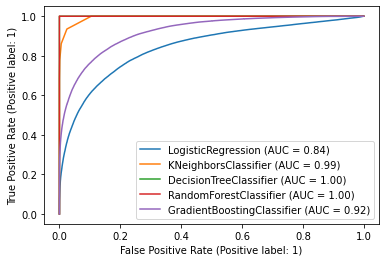

In [66]:
#how wel our model is works on training data 
disp=plot_roc_curve(lr,x_train,y_train)
plot_roc_curve(knn,x_train,y_train,ax=disp.ax_)
plot_roc_curve(dcfr,x_train,y_train,ax=disp.ax_)
plot_roc_curve(rfclf,x_train,y_train,ax=disp.ax_)
plot_roc_curve(gbdt,x_train,y_train,ax=disp.ax_)

plt.legend(prop={'size':10},loc='lower right')
plt.show()

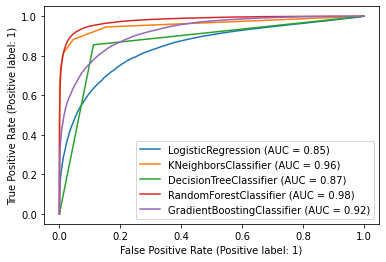

In [67]:
disp=plot_roc_curve(lr,x_test,y_test)
plot_roc_curve(knn,x_test,y_test,ax=disp.ax_)
plot_roc_curve(dcfr,x_test,y_test,ax=disp.ax_)
plot_roc_curve(rfclf,x_test,y_test,ax=disp.ax_)
plot_roc_curve(gbdt,x_test,y_test,ax=disp.ax_)

plt.legend(prop={'size':10},loc='lower right')
plt.show()

#the above plots shows random forest,gradient boosting clasifier and kneighborsclassifier are given best results but iam choosing kneighbors classifier as final model since our problem is related to bussiness scenerio so we consider false positive rate should be minimum or less so in the knn FP rate is less than all other so this is the best model for choosing as final 


In [55]:
#hyper parameter tunning 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
knn=KNeighborsClassifier()
params={ 'algorithm' : ['kd_tree','brute'],
         'leaf_size' : [5,6,7],
         'n_neighbors' : [6,7,8,]
           }


grd=GridSearchCV(knn,param_grid=params)
grd.fit(x_train,y_train)
print('best params==>', grd.best_params_)

knn.fit(x_train,y_train)
y_pred=knn.predict(x_test)

rf_conf_mat=confusion_matrix(y_test,y_pred)


best params==> {'algorithm': 'kd_tree', 'leaf_size': 5, 'n_neighbors': 7}


In [56]:
rf_conf_mat

array([[39176,   568],
       [ 7354, 32375]], dtype=int64)

In [57]:
accuracy_score(y_test,y_pred)

0.9003183471115976

In [58]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.84      0.99      0.91     39744
           1       0.98      0.81      0.89     39729

    accuracy                           0.90     79473
   macro avg       0.91      0.90      0.90     79473
weighted avg       0.91      0.90      0.90     79473



In [59]:
#save the model
import pickle
filename='micro credit defaulter predction.pkl'
pickle.dump(knn,open(filename,'wb'))

In [60]:
#conclusion
loaded_model= pickle.load(open('micro credit defaulter predction.pkl', 'rb'))
results=loaded_model.score(x_test,y_test)
print('test score score is:-',results)

test score score is:- 0.9003183471115976


In [61]:
#conclusion

conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_pred[:]],index=["predicted","original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021